---------------------------------------------------------------------
## Data Science with Python
### Task 2: Prepare and Explore the Data
#### By Roslyn Badilla
#### March, 2020
---------------------------------------------------------------------

## Import Libraries

In [2]:
import numpy as np
import pandas as pd
import pandas_profiling
from pandas import Series, DataFrame
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns 

In [3]:
credit = pd.read_csv('default of credit card clients.csv', header =1)

## Initial Analysis

In [4]:
# Code for basic analysis
credit.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [5]:
credit.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [6]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
ID                            30000 non-null int64
LIMIT_BAL                     30000 non-null int64
SEX                           30000 non-null int64
EDUCATION                     30000 non-null int64
MARRIAGE                      30000 non-null int64
AGE                           30000 non-null int64
PAY_0                         30000 non-null int64
PAY_2                         30000 non-null int64
PAY_3                         30000 non-null int64
PAY_4                         30000 non-null int64
PAY_5                         30000 non-null int64
PAY_6                         30000 non-null int64
BILL_AMT1                     30000 non-null int64
BILL_AMT2                     30000 non-null int64
BILL_AMT3                     30000 non-null int64
BILL_AMT4                     30000 non-null int64
BILL_AMT5                     30000 non-null int64
BILL_AMT6               

In [7]:
#check nulls

null_columns=credit.columns[credit.isnull().any()]

credit[null_columns].isnull().sum()

Series([], dtype: float64)

In [8]:
corrMat = credit.corr()
print(corrMat)

                                  ID  LIMIT_BAL       SEX  EDUCATION  \
ID                          1.000000   0.026179  0.018497   0.039177   
LIMIT_BAL                   0.026179   1.000000  0.024755  -0.219161   
SEX                         0.018497   0.024755  1.000000   0.014232   
EDUCATION                   0.039177  -0.219161  0.014232   1.000000   
MARRIAGE                   -0.029079  -0.108139 -0.031389  -0.143464   
AGE                         0.018678   0.144713 -0.090874   0.175061   
PAY_0                      -0.030575  -0.271214 -0.057643   0.105364   
PAY_2                      -0.011215  -0.296382 -0.070771   0.121566   
PAY_3                      -0.018494  -0.286123 -0.066096   0.114025   
PAY_4                      -0.002735  -0.267460 -0.060173   0.108793   
PAY_5                      -0.022199  -0.249411 -0.055064   0.097520   
PAY_6                      -0.020270  -0.235195 -0.044008   0.082316   
BILL_AMT1                   0.019389   0.285430 -0.033642   0.02

[25 rows x 25 columns]


In [9]:
covMat = credit.cov()
print(covMat)

                                      ID     LIMIT_BAL          SEX  \
ID                          7.500250e+07  2.941664e+07    78.356379   
LIMIT_BAL                   2.941664e+07  1.683446e+10  1571.050630   
SEX                         7.835638e+01  1.571051e+03     0.239247   
EDUCATION                   2.681543e+02 -2.247403e+04     0.005502   
MARRIAGE                   -1.314525e+02 -7.323670e+03    -0.008014   
AGE                         1.491057e+03  1.730767e+05    -0.409726   
PAY_0                      -2.975726e+02 -3.954593e+04    -0.031685   
PAY_2                      -1.162770e+02 -4.603765e+04    -0.041442   
PAY_3                      -1.916922e+02 -4.443225e+04    -0.038694   
PAY_4                      -2.769132e+01 -4.057181e+04    -0.034411   
PAY_5                      -2.178600e+02 -3.667056e+04    -0.030521   
PAY_6                      -2.018774e+02 -3.509308e+04    -0.024754   
BILL_AMT1                   1.236447e+07  2.727020e+09 -1211.694332   
BILL_A

[25 rows x 25 columns]


## Recode numerical vars into categorical

In [10]:
#Create Bins for LIMIT_BAL(Amount of credit) 
credit['CREDIT_GROUP'] = pd.cut(credit['LIMIT_BAL'], bins=6)
credit['CREDIT_GROUP'].value_counts(sort=True)

(9010.0, 175000.0]       17626
(175000.0, 340000.0]      8786
(340000.0, 505000.0]      3382
(505000.0, 670000.0]       170
(670000.0, 835000.0]        35
(835000.0, 1000000.0]        1
Name: CREDIT_GROUP, dtype: int64

In [11]:
# Transform SEX variable into binary variable "isFemale"
def gender_groups(series):
    if series == 1:
        return "0"
    elif series == 2:
        return "1"

credit['IS_FEMALE'] = credit['SEX'].apply(gender_groups)

credit['IS_FEMALE'].value_counts(sort=False)

0    11888
1    18112
Name: IS_FEMALE, dtype: int64

In [12]:
# Grouping 0,4,5,6 values for Others into one: "0" for Others
def educ_groups(series):
    if series == 1:
        return "1"
    elif series == 2:
        return "2"
    elif series == 3:
        return "3"
    else:
        return "0"

credit['EDUCATION'] = credit['EDUCATION'].apply(educ_groups)

credit['EDUCATION'].value_counts(sort=False)

2    14030
0      468
3     4917
1    10585
Name: EDUCATION, dtype: int64

In [13]:
#Convert Marriage variable into Categorical
credit['MARRIAGE'] = pd.Categorical(credit.MARRIAGE)
print (credit['MARRIAGE'].dtypes)

category


In [14]:
#Create Bins for Age using quantiles
credit['AGE_GROUP'] = pd.qcut(credit['AGE'], q=5)
credit['AGE_GROUP'].value_counts(sort=True)

(31.0, 37.0]      6728
(20.999, 27.0]    6604
(43.0, 79.0]      5986
(27.0, 31.0]      5626
(37.0, 43.0]      5056
Name: AGE_GROUP, dtype: int64

In [15]:
#Create 5 Bins for Age 
credit['AGE_GROUP2'] = pd.cut(credit['AGE'], bins=5)
credit['AGE_GROUP2'].value_counts(sort=True)

(20.942, 32.6]    13388
(32.6, 44.2]      11326
(44.2, 55.8]       4442
(55.8, 67.4]        799
(67.4, 79.0]         45
Name: AGE_GROUP2, dtype: int64

In [16]:
#Convert PAY variables into Categorical
credit['PAY_0'] = pd.Categorical(credit.PAY_0)
credit['PAY_2'] = pd.Categorical(credit.PAY_2)
credit['PAY_3'] = pd.Categorical(credit.PAY_3)
credit['PAY_4'] = pd.Categorical(credit.PAY_4)
credit['PAY_5'] = pd.Categorical(credit.PAY_5)
credit['PAY_6'] = pd.Categorical(credit.PAY_6)
print (credit.dtypes)

ID                               int64
LIMIT_BAL                        int64
SEX                              int64
EDUCATION                       object
MARRIAGE                      category
AGE                              int64
PAY_0                         category
PAY_2                         category
PAY_3                         category
PAY_4                         category
PAY_5                         category
PAY_6                         category
BILL_AMT1                        int64
BILL_AMT2                        int64
BILL_AMT3                        int64
BILL_AMT4                        int64
BILL_AMT5                        int64
BILL_AMT6                        int64
PAY_AMT1                         int64
PAY_AMT2                         int64
PAY_AMT3                         int64
PAY_AMT4                         int64
PAY_AMT5                         int64
PAY_AMT6                         int64
default payment next month       int64
CREDIT_GROUP             

In [17]:
#Rename Default Variable
credit = credit.rename(columns={'default payment next month': 'DEFAULT'})
print (credit.dtypes)

ID                 int64
LIMIT_BAL          int64
SEX                int64
EDUCATION         object
MARRIAGE        category
AGE                int64
PAY_0           category
PAY_2           category
PAY_3           category
PAY_4           category
PAY_5           category
PAY_6           category
BILL_AMT1          int64
BILL_AMT2          int64
BILL_AMT3          int64
BILL_AMT4          int64
BILL_AMT5          int64
BILL_AMT6          int64
PAY_AMT1           int64
PAY_AMT2           int64
PAY_AMT3           int64
PAY_AMT4           int64
PAY_AMT5           int64
PAY_AMT6           int64
DEFAULT            int64
CREDIT_GROUP    category
IS_FEMALE         object
AGE_GROUP       category
AGE_GROUP2      category
dtype: object


## Analysis with Profiling

In [19]:
profile = pandas_profiling.ProfileReport(credit)

In [20]:
profile.to_widgets()

In [21]:
profile.to_file(output_file="Profiling_report.html")
#### HTML report HERE: https://github.com/roslynbs/DataSciencewithPython/blob/master/Profiling_report.html

## Visualization

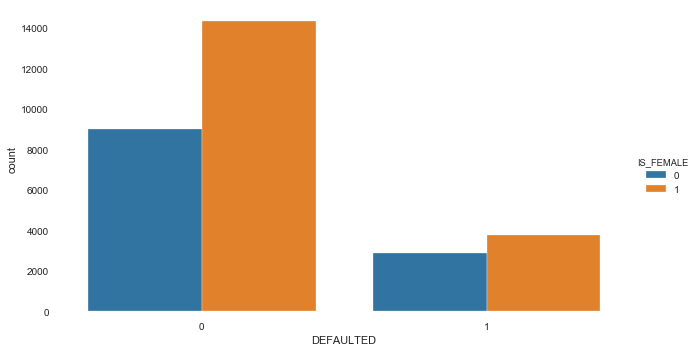

In [25]:
# Group by Sex and Default
g = sns.factorplot('DEFAULT', data=credit, hue='IS_FEMALE', kind='count', aspect=1.75)
g.set_xlabels('DEFAULTED')

In [26]:
# Number of clients defaulted by age_group and gender
credit.pivot_table('DEFAULT', 'IS_FEMALE', 'AGE_GROUP', aggfunc=np.sum, margins=True)

AGE_GROUP,"(20.999, 27.0]","(27.0, 31.0]","(31.0, 37.0]","(37.0, 43.0]","(43.0, 79.0]",All
IS_FEMALE,,,,,,
0,556,464,623,523,707,2873
1,1042,638,757,577,749,3763
All,1598,1102,1380,1100,1456,6636


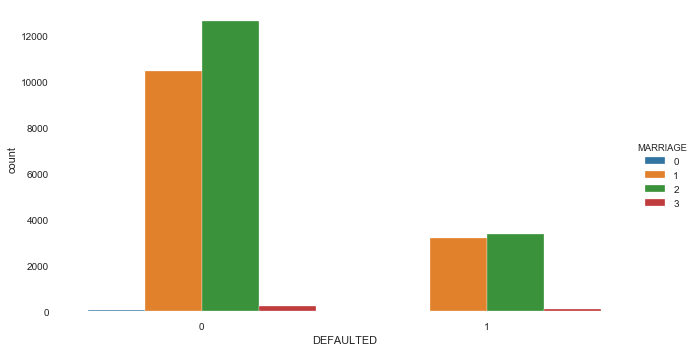

In [29]:
# Group by Marriage and Default
#Marriage Decoding 1=Married 2=Single 3=Divorced 0=Other
g = sns.factorplot('DEFAULT', data=credit, hue='MARRIAGE', kind='count', aspect=1.75)
g.set_xlabels('DEFAULTED')

In [31]:
# Number of clients defaulted by age_group and gender
credit.pivot_table('DEFAULT', 'MARRIAGE', 'IS_FEMALE', aggfunc=np.sum, margins=True)

IS_FEMALE,0,1,All
MARRIAGE,,,
0,2,3,5
1,1346,1860,3206
2,1485,1856,3341
3,40,44,84
All,2873,3763,6636


Text(0.5, 1.0, "Distribution of Clients' Ages")

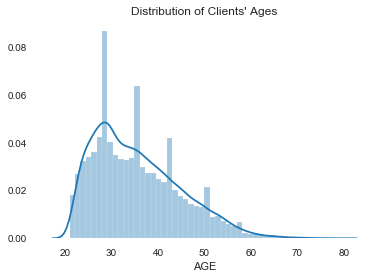

In [28]:
# Distribution of age
age_dist = sns.distplot(credit.AGE)
age_dist.set_title("Distribution of Clients' Ages")